In [1]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet


def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

sys.platform: linux
Python: 3.9.15 (main, Nov 24 2022, 14:31:59) [GCC 11.2.0]
CUDA available: True
numpy_random_seed: 2147483648
GPU 0,1,2,3,4,5: NVIDIA GeForce RTX 3090
CUDA_HOME: /usr/local/cuda-11.8:/usr/local/cuda-10.2:/usr/local/cuda-11.8:/usr/local/cuda-10.2:
GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
PyTorch: 1.10.1
PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2021.4-Product Build 20210904 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055cf1bfa13efb658fe15dc9b41f0740)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_61,code=sm_61;-gencode;arch=compute_70,code=sm_70;-gencode;arch=co

# 可视化数据集

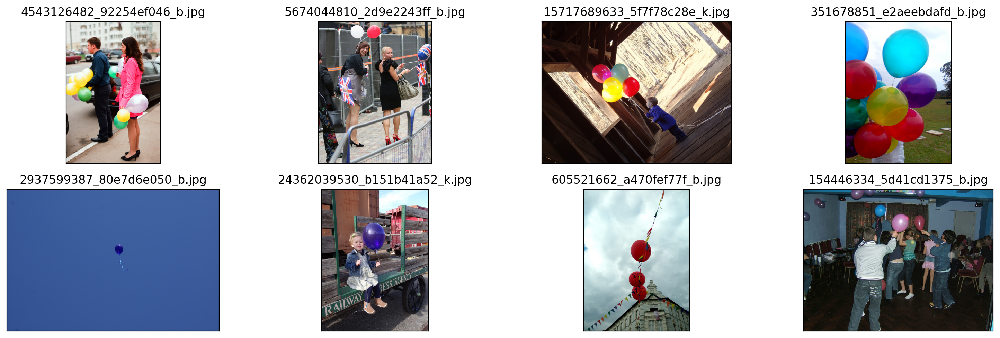

In [4]:
import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

image_path = [filename for filename in os.listdir('/home/zlj/openmmlab_AI/qiqiu_data/balloon/train')][:8]

for idx, filename in enumerate(image_path):
    name = os.path.splitext(filename)[0]

    image = Image.open('/home/zlj/openmmlab_AI/qiqiu_data/balloon/train/'+filename).convert("RGB")

    plt.subplot(2, 4, idx+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

# 将数据集转为CoCo

In [7]:
import json
from pathlib import Path
import shutil

from shapely.geometry import Polygon
from PIL import Image


class CocoFormat:
    @staticmethod
    def create_category_info(category_id, category_name):
        category_info = {'id': category_id,
                         'name': category_name}
        return category_info

    @staticmethod
    def create_image_info(image_id,
                          image_file_name,
                          image_height,
                          image_width):
        image_info = {'id': image_id,
                      'file_name': image_file_name,
                      'height': image_height,
                      'width': image_width}

        return image_info

    @staticmethod
    def create_annotation_info(annotation_id,
                               image_id,
                               category_id,
                               is_crowd,
                               bbox,
                               segmentation,
                               area):
        annotation_info = {'id': annotation_id,
                           'image_id': image_id,
                           'category_id': category_id,
                           'iscrowd': is_crowd,
                           'bbox': bbox,
                           'area': area,
                           'segmentation': segmentation}

        return annotation_info

def convert(image_dir_path,
            via_ann_file_path,
            category_names,
            output_images_dir_path=None,
            output_ann_file_path=None,
            first_category_index=1):
    category_dict = {}

    coco_categories = []

    for category_id, category_name in enumerate(category_names, start=first_category_index):
        category_dict[category_name] = category_id
        coco_category = CocoFormat.create_category_info(category_id, category_name)
        coco_categories.append(coco_category)

    with open(Path(via_ann_file_path).as_posix(), 'r') as file_stream:
        via_ann_data = json.load(file_stream)

    coco_images = []
    coco_annotations = []

    image_dir_path = Path(image_dir_path)
    default_category_name = category_names[0]
    image_id = 0
    annotation_id = 0

    for via_ann_key, via_ann in via_ann_data.items():
        image_file_name = via_ann['filename']
        image_file_path = image_dir_path / image_file_name

        assert image_file_path.exists(), r'Error! image_file_path {} not exist!'.format(image_file_path)

        if output_images_dir_path is not None:
            output_images_dir_path.mkdir(parents=True, exist_ok=True)

            output_image_file_path = output_images_dir_path / image_file_path.name
            shutil.copyfile(image_file_path.as_posix(), output_image_file_path.as_posix())

        with Image.open(image_file_path.as_posix()) as image:
            image_width, image_height = image.size

        image_info = CocoFormat.create_image_info(
                              image_id,
                              Path(image_file_name).name,
                              image_height,
                              image_width
        )

        coco_images.append(image_info)

        via_regions = via_ann['regions']

        for via_region_index, via_region in via_regions.items():
            region_attributes = via_region['region_attributes']
            category_name = region_attributes.get('label', default_category_name)
            category_id = category_dict.get(category_name)

            if category_id is None:
                warn_info_format = r'Warning: Ignore because category_name {} from image_file_name {} not in category_names {}'
                warn_info = warn_info_format.format(category_name,
                                  image_file_name,
                                  category_names)
                print(warn_info)
                continue

            is_crowd = 0

            shape_attributes = via_region['shape_attributes']
            all_points_x = shape_attributes['all_points_x']
            all_points_y = shape_attributes['all_points_y']

            points = [(x, y) for x, y in zip(all_points_x, all_points_y)]
            polygon = Polygon(points)

            x_min, y_min, x_max, y_max = polygon.bounds
            bbox = [x_min, y_min, x_max - x_min, y_max - y_min]

            segmentation = []

            for x, y in points:
                segmentation.extend([x, y])

            area = polygon.area

            coco_annotation = CocoFormat.create_annotation_info(annotation_id,
                                       image_id,
                                       category_id,
                                       is_crowd,
                                       bbox,
                                       segmentation,
                                       area)
            coco_annotations.append(coco_annotation)
            annotation_id += 1

        image_id += 1


    coco_output = {'images': coco_images,
                   'categories': coco_categories,
                   'annotations': coco_annotations}

    if output_ann_file_path is not None:
        output_ann_file_path.parent.mkdir(parents=True, exist_ok=True)

        with open(Path(output_ann_file_path).as_posix(), 'w') as file_stream:
            json.dump(coco_output, file_stream, indent=4)

    return coco_output


def zhuan():
    category_names = ['balloon']
    data_path_infos = [{
                        'image_dir_path': r'/home/zlj/openmmlab_AI/qiqiu_data/balloon/train',
                        'output_ann_file_name': 'train.json'
                       },
                       {
                        'image_dir_path': r'/home/zlj/openmmlab_AI/qiqiu_data/balloon/val',
                        'output_ann_file_name': 'val.json'
                       }]

    outout_dir_path = Path('/home/zlj/openmmlab_AI/qiqiu_data/balloon/')
    output_images_dir_path = outout_dir_path / 'images'
    output_ann_dir_path = outout_dir_path / 'annotations'

    for data_path_info in data_path_infos:
        image_dir_path = Path(data_path_info['image_dir_path'])
        via_ann_file_path = image_dir_path / 'via_region_data.json'

        output_ann_file_name = data_path_info['output_ann_file_name']
        output_ann_file_path = output_ann_dir_path / output_ann_file_name

        convert(image_dir_path,
                via_ann_file_path,
                category_names,
                output_images_dir_path=output_images_dir_path,
                output_ann_file_path=output_ann_file_path)


zhuan()

# 可视化标签

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


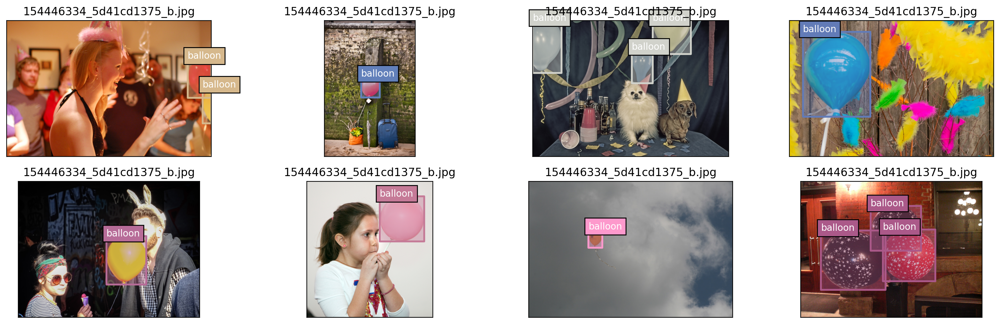

In [9]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image
    
    try:
        exif = image.getexif()
    except Exception:
        exif = None

    if exif is None:
        return image
    
    orientation = exif.get(_EXIF_ORIENT)

    method = {
        2: Image.FLIP_LEFT_RIGHT,
        3: Image.ROTATE_180,
        4: Image.FLIP_TOP_BOTTOM,
        5: Image.TRANSPOSE,
        6: Image.ROTATE_270,
        7: Image.TRANSVERSE,
        8: Image.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image

def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    if len(anns) == 0:
        return
    
    ax = plt.gca()
    ax.set_autoscale_on(False)

    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]

    polygons = []
    colors = []

    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4, 2))))
        colors.append(color)

        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None

        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox,
        )
    
    if is_filling:
        p = PatchCollection(polygons, facecolor=colors, linewidths=0, alpha=0.4)
        ax.add_collection(p)
    p = PatchCollection(polygons, facecolor='none', edgecolors=colors, linewidths=2)
    ax.add_collection(p)

coco = COCO('/home/zlj/openmmlab_AI/qiqiu_data/balloon/annotations/train.json')
image_ids = coco.getImgIds()
# print(image_ids)
np.random.shuffle(image_ids)

plt.figure(figsize=(16, 5))

for idx in range(8):
    image_data = coco.loadImgs(image_ids[idx])[0]
    image_path = osp.join('/home/zlj/openmmlab_AI/qiqiu_data/balloon/train', image_data['file_name'])
    annotation_ids = coco.getAnnIds(imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)

    ax = plt.subplot(2, 4, idx+1)
    image = Image.open(image_path).convert("RGB")

    image = apply_exif_orientation(image)

    ax.imshow(image)

    show_bbox_only(coco, annotations)

    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()


# 训练前可视化验证

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
06/11 16:14:18 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


/home/zlj/miniconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/zlj/miniconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


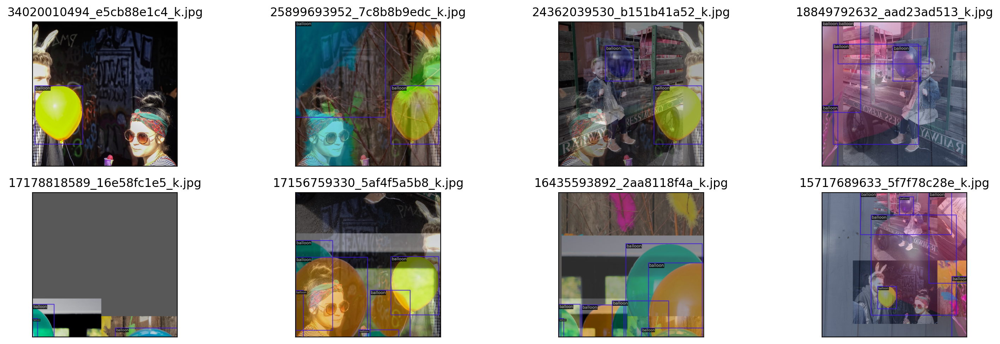

In [12]:
from mmdet.registry import DATASETS, VISUALIZERS
from mmengine.config import Config
from mmengine.registry import init_default_scope

cfg = Config.fromfile('/home/zlj/openmmlab_AI/mmdetection/configs/ours/myconfig.py')

init_default_scope(cfg.get('default_scope', 'mmdet'))

dataset = DATASETS.build(cfg.train_dataloader.dataset)
visualizer = VISUALIZERS.build(cfg.visualizer)
visualizer.dataset_meta = dataset.metainfo

plt.figure(figsize=(16, 5))

for idx in range(8):
    item = dataset[idx]

    img = item['inputs'].permute(1, 2, 0).numpy()
    data_sample = item['data_samples'].numpy()
    gt_instances = data_sample.gt_instances
    img_path = osp.basename(item['data_samples'].img_path)

    gt_bboxes = gt_instances.get('bboxes', None)
    gt_instances.bboxes = gt_bboxes.tensor
    data_sample.gt_instances = gt_instances

    visualizer.add_datasample(
        osp.basename(img_path),
        img,
        data_sample,
        draw_pred=False,
        show=False,
    )
    drawed_image = visualizer.get_image()

    plt.subplot(2, 4, idx+1)
    plt.imshow(drawed_image[..., [2, 1, 0]])
    plt.title(f"{osp.basename(img_path)}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

# 模型训练

In [16]:
!CUDA_VISIBLE_DEVICES=2 mim train mmdet /home/zlj/openmmlab_AI/mmdetection/configs/ours/myconfig.py --work-dir=./qiIuwork_dirs/rtmdet_tiny

Training command is /home/zlj/miniconda3/envs/openmmlab/bin/python /data/A/zlj/miniconda3/envs/openmmlab/lib/python3.9/site-packages/mmdet/.mim/tools/train.py /home/zlj/openmmlab_AI/mmdetection/configs/ours/myconfig.py --launcher none --work-dir=./qiIuwork_dirs/rtmdet_tiny. 
06/11 16:18:59 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.9.15 (main, Nov 24 2022, 14:31:59) [GCC 11.2.0]
    CUDA available: True
    numpy_random_seed: 1399120622
    GPU 0: NVIDIA GeForce RTX 3090
    CUDA_HOME: /usr/local/cuda-11.8:/usr/local/cuda-10.2:/usr/local/cuda-11.8:/usr/local/cuda-10.2:
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
    PyTorch: 1.10.1
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2021.4-Product Build 20210904 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055

                        'type': 'RandomFlip',
                        'prob': 0.0
                    }],
                    [{
                        'type': 'Pad',
                        'size': (960, 960),
                        'pad_val': {
                            'img': (114, 114, 114)
                        }
                    }],
                    [{
                        'type':
                        'PackDetInputs',
                        'meta_keys':
                        ('img_id', 'img_path', 'ori_shape', 'img_shape',
                         'scale_factor', 'flip', 'flip_direction')
                    }]])
]
model = dict(
    type='RTMDet',
    data_preprocessor=dict(
        type='DetDataPreprocessor',
        mean=[103.53, 116.28, 123.675],
        std=[57.375, 57.12, 58.395],
        bgr_to_rgb=False,
        batch_augments=None),
    backbone=dict(
        type='CSPNeXt',
        arch='P5',
        expand_ratio=0.5,
        deepen_factor=0.167,
   

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
06/11 16:19:10 - mmengine - INFO - load backbone. in model from: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/cspnext_rsb_pretrain/cspnext-tiny_imagenet_600e.pth
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/cspnext_rsb_pretrain/cspnext-tiny_imagenet_600e.pth
Downloading: "https://download.openmmlab.com/mmdetection/v3.0/rtmdet/cspnext_rsb_pretrain/cspnext-tiny_imagenet_600e.pth" to /home/zlj/.cache/torch/hub/checkpoints/cspnext-tiny_imagenet_600e.pth
100%|██████████████████████████████████████| 31.5M/31.5M [00:02<00:00, 11.8MB/s]
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth
Downloading: "https://download.openmmlab.com/mmdete

06/11 16:20:16 - mmengine - INFO - Epoch(val) [10][13/13]    coco/bbox_mAP: 0.3170  coco/bbox_mAP_50: 0.4320  coco/bbox_mAP_75: 0.3390  coco/bbox_mAP_s: 0.0000  coco/bbox_mAP_m: 0.0560  coco/bbox_mAP_l: 0.4980  data_time: 0.0325  time: 0.0562
06/11 16:20:18 - mmengine - INFO - The best checkpoint with 0.3170 coco/bbox_mAP at 10 epoch is saved to best_coco_bbox_mAP_epoch_10.pth.
06/11 16:20:23 - mmengine - INFO - Epoch(train) [11][5/6]  lr: 1.8750e-04  eta: 0:02:41  time: 0.8470  data_time: 0.6839  memory: 1540  loss: 2.5640  loss_cls: 2.0306  loss_bbox: 0.5334
06/11 16:20:23 - mmengine - INFO - Exp name: myconfig_20230611_161858
06/11 16:20:28 - mmengine - INFO - Epoch(train) [12][5/6]  lr: 1.8750e-04  eta: 0:02:34  time: 0.8470  data_time: 0.6822  memory: 1534  loss: 2.3981  loss_cls: 1.8984  loss_bbox: 0.4997
06/11 16:20:28 - mmengine - INFO - Exp name: myconfig_20230611_161858
06/11 16:20:33 - mmengine - INFO - Epoch(train) [13][5/6]  lr: 1.8750e-04  eta: 0:02:28  time: 0.8542  data

06/11 16:22:01 - mmengine - INFO - Exp name: myconfig_20230611_161858
06/11 16:22:01 - mmengine - INFO - Saving checkpoint at 30 epochs
06/11 16:22:03 - mmengine - INFO - Epoch(val) [30][ 5/13]    eta: 0:00:00  time: 0.0533  data_time: 0.0305  memory: 196  
06/11 16:22:03 - mmengine - INFO - Epoch(val) [30][10/13]    eta: 0:00:00  time: 0.0494  data_time: 0.0265  memory: 105  
06/11 16:22:03 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.12s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.680
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.792
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.781
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.020
 Average Precision  (AP) @[ IoU=0.

# 推理

In [19]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = '/home/zlj/openmmlab_AI/mmdetection/configs/ours/myconfig.py'
# Setup a checkpoint file to load
checkpoint = "/home/zlj/openmmlab_AI/qiIuwork_dirs/rtmdet_tiny/best_coco_bbox_mAP_epoch_30.pth"

# Set the device to be used for evaluation
device = 'cuda:2'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Use the detector to do inference
img = "/home/zlj/openmmlab_AI/qiqiu_data/qiqiu.png"
result = inferencer(img, out_dir='./qiqiuoutputs')

Loads checkpoint by local backend from path: /home/zlj/openmmlab_AI/qiIuwork_dirs/rtmdet_tiny/best_coco_bbox_mAP_epoch_30.pth


Output()

/home/zlj/miniconda3/envs/openmmlab/lib/python3.9/site-packages/torch/functional.py:445: UserWarning: 
torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at
/opt/conda/conda-bld/pytorch_1639180487213/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

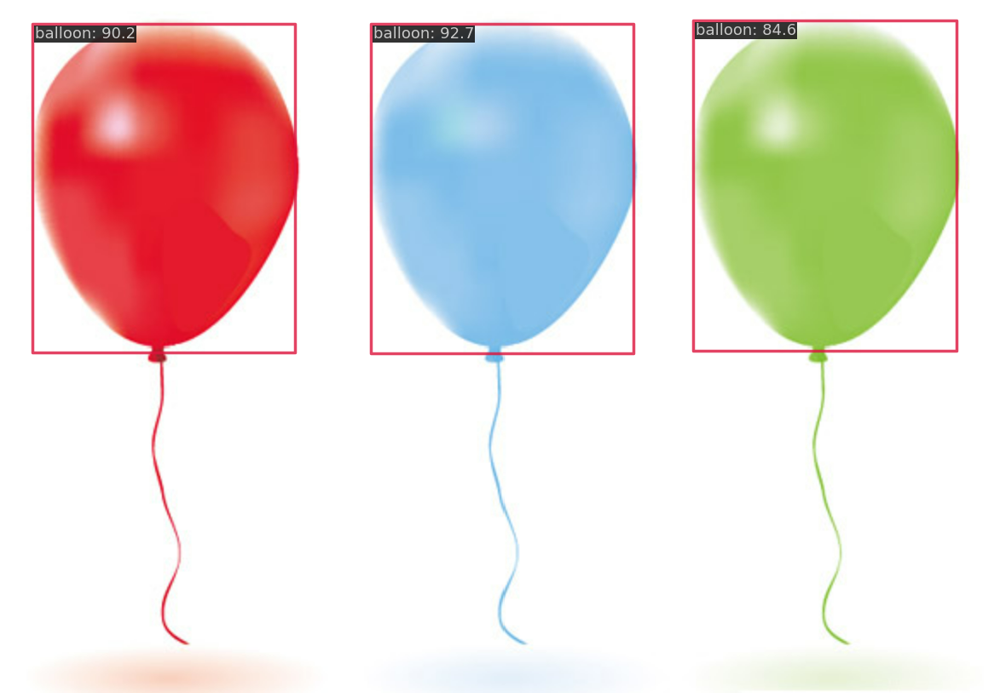

In [23]:
Image.open('/home/zlj/openmmlab_AI/qiqiuoutputs/vis/qiqiu.png')

# 可视化分析

In [21]:
import cv2

img = cv2.imread('/home/zlj/openmmlab_AI/qiqiuoutputs/vis/qiqiu.png')
h, w = img.shape[:2]
resized_img = cv2.resize(img, (640, 640))
cv2.imwrite('resized_image.jpg', resized_img)

True

In [26]:
!CUDA_VISIBLE_DEVICES=2 python /home/zlj/openmmlab_AI/mmyolo-main/demo/featmap_vis_demo.py \
    /home/zlj/openmmlab_AI/resized_image.jpg /home/zlj/openmmlab_AI/mmdetection/configs/ours/myconfig.py \
    /home/zlj/openmmlab_AI/qiIuwork_dirs/rtmdet_tiny/best_coco_bbox_mAP_epoch_30.pth \
    --target-layers backbone \
    --channel-reduction squeeze_mean

Loads checkpoint by local backend from path: /home/zlj/openmmlab_AI/qiIuwork_dirs/rtmdet_tiny/best_coco_bbox_mAP_epoch_30.pth
06/11 16:37:45 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/home/zlj/miniconda3/envs/openmmlab/lib/python3.9/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1639180487213/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/zlj/miniconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/visualization/visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.war

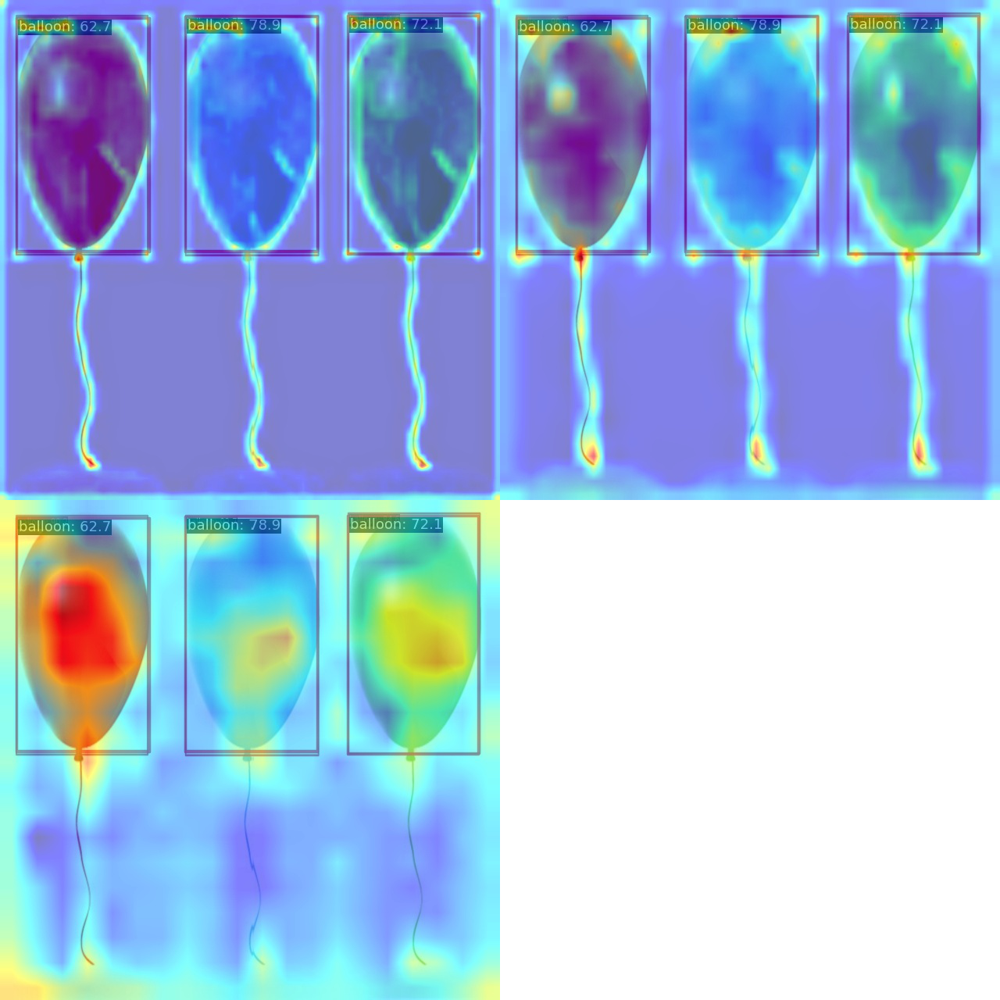

In [28]:
Image.open('/home/zlj/openmmlab_AI/output/resized_image.jpg')

In [31]:
!CUDA_VISIBLE_DEVICES=2 python /home/zlj/openmmlab_AI/mmyolo-main/demo/featmap_vis_demo.py \
    /home/zlj/openmmlab_AI/resized_image.jpg /home/zlj/openmmlab_AI/mmdetection/configs/ours/myconfig.py \
    /home/zlj/openmmlab_AI/qiIuwork_dirs/rtmdet_tiny/best_coco_bbox_mAP_epoch_30.pth \
    --target-layers neck \
    --channel-reduction squeeze_mean

Loads checkpoint by local backend from path: /home/zlj/openmmlab_AI/qiIuwork_dirs/rtmdet_tiny/best_coco_bbox_mAP_epoch_30.pth
06/11 16:40:53 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/home/zlj/miniconda3/envs/openmmlab/lib/python3.9/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1639180487213/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/zlj/miniconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/visualization/visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.war

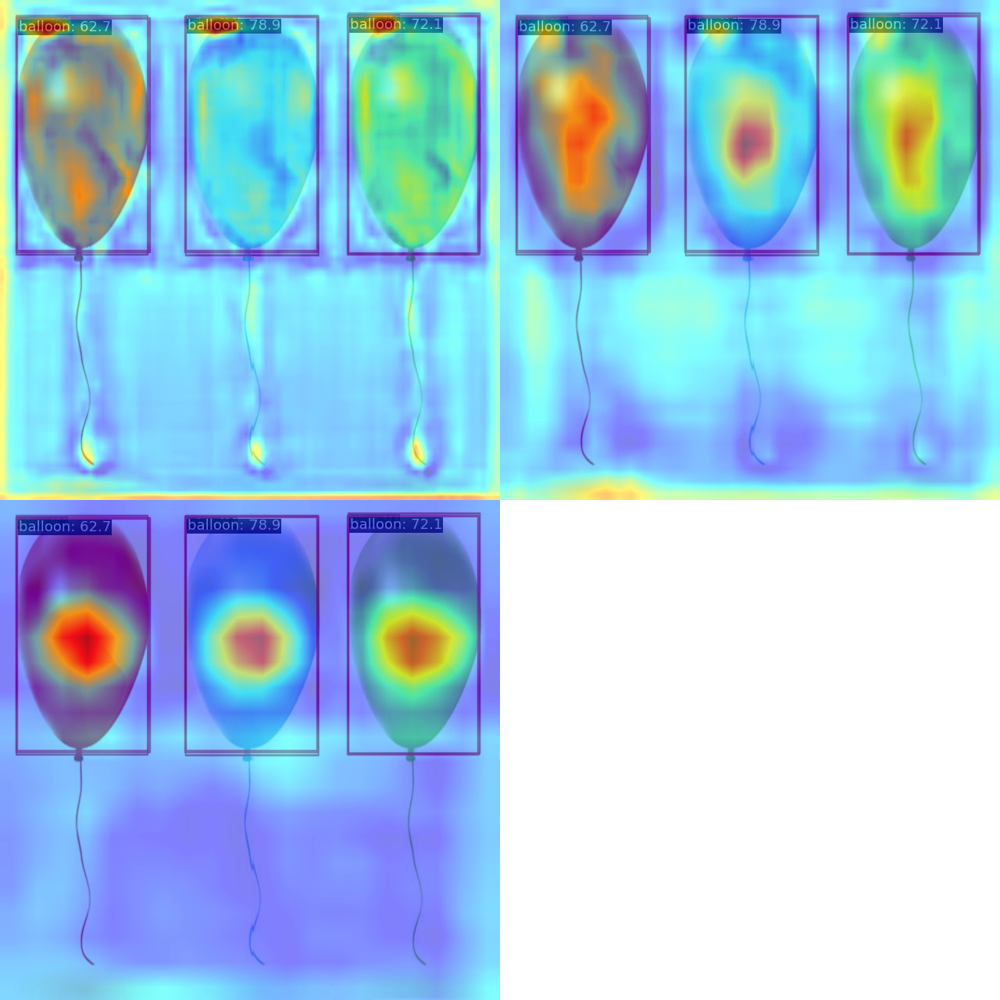

In [33]:
Image.open('/home/zlj/openmmlab_AI/output/resized_image.jpg')